# Project 19: Data-driven Geo Schelling model


For the realization and the visualization of the gif the following module is required

In [1]:
#!pip install html2image

The module requires Chrome installed in the machine, for the moment is the only browser supported. For this reasion this notebook can't be executed in Coolab. 

### Import the Datasets 

In [2]:
import io
import zipfile
import requests
import pandas as pd
import geopandas as gpd

import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [3]:
pd.set_option('display.max_rows', None) #For analyzing the results

#### People dataset
This file contains information about the
racial composition of each census tract in the US 

In [4]:
url = "https://opportunityinsights.org/wp-content/uploads/2018/10/tract_covariates.csv"
data = requests.get(url).content
df = pd.read_csv(io.StringIO(data.decode('utf-8')))
df.head()

,state,county,tract,cz,czname,hhinc_mean2000,mean_commutetime2000,frac_coll_plus2000,frac_coll_plus2010,foreign_share2010,...,singleparent_share2000,traveltime15_2010,emp2000,mail_return_rate2010,ln_wage_growth_hs_grad,jobs_total_5mi_2015,jobs_highpay_5mi_2015,popdensity2010,ann_avg_job_growth_2004_2013,job_density_2013
0,1,1,20100,11101.0,Montgomery,68638.727,26.171911,0.156479,0.254428,0.009950,...,0.250980,0.273034,0.567308,83.500000,0.038233,10109.0,3396.0,504.75183,-0.006769,92.133049
1,1,1,20200,11101.0,Montgomery,57242.512,24.806705,0.146932,0.267194,0.016337,...,0.392523,0.152040,0.493169,81.300003,0.089306,9948.0,3328.0,1682.17050,-0.004253,971.317870
2,1,1,20300,11101.0,Montgomery,75647.727,25.322525,0.224413,0.164159,0.027096,...,0.244856,0.205534,0.578560,79.500000,-0.177743,10387.0,3230.0,1633.41390,0.014218,340.920070
3,1,1,20400,11101.0,Montgomery,74852.055,22.965347,0.230469,0.252744,0.015083,...,0.190722,0.350673,0.596501,83.500000,-0.072311,12933.0,3635.0,1780.03250,-0.019841,207.386370
4,1,1,20500,11101.0,Montgomery,96174.766,26.222353,0.321154,0.375063,0.046488,...,0.168000,0.250496,0.661268,77.300003,-0.096140,12933.0,3635.0,2446.26220,0.018627,800.272640


Manupulate the state, county and tract column so it is compatible with the Census Boureau file. The problem is the different rappresentation of the information (61 in this file and 061 in the census one). I added zeros where necessary to make the geoids of the two dataframes homogeneous.   

In [5]:
df['state'] = df['state'].astype(str)
df['county'] = df['county'].astype(str)
df['tract'] = df['tract'].astype(str)

for index, row in df.iterrows():
  if len(row['state']) == 1:  #state
    value = '0'+ row['state']
    df.at[index, 'state'] =  value 
  
  if len(row['county']) == 1: #county
    value = '00'+ row['county']
    df.at[index, 'county'] =  value 
  if len(row['county']) == 2:
    value = '0'+ row['county']
    df.at[index, 'county'] =  value
  
  if len(row['tract']) < 6: #tract
    value = row['tract']
    while len(value) < 6:
      value = '0' + value
    df.at[index, 'tract'] =  value  

Create the column geoid concatenating the column state, country and tract

In [6]:
df['geoid'] = df['state'].map(str) + df['county'].map(str) + df['tract'].map(str)

Creating the american_share2010 as 1 - forgein_share2010

In [7]:
df['foreign_share2010'].fillna(0, inplace = True) #fill missing values with 0

df['american_share2010'] = 1 - df['foreign_share2010']

Select only the relevant columns for our scope

In [8]:
df = df.filter(['state', 
                'county', 
                'tract', 
                'cz', 
                'czname', 
                'popdensity2010', 
                'foreign_share2010', 
                'american_share2010', 
                'geoid'], axis=1)

df.head()

,state,county,tract,cz,czname,popdensity2010,foreign_share2010,american_share2010,geoid
0,01,001,020100,11101.0,Montgomery,504.75183,0.009950,0.990050,01001020100
1,01,001,020200,11101.0,Montgomery,1682.17050,0.016337,0.983663,01001020200
2,01,001,020300,11101.0,Montgomery,1633.41390,0.027096,0.972904,01001020300
3,01,001,020400,11101.0,Montgomery,1780.03250,0.015083,0.984917,01001020400
4,01,001,020500,11101.0,Montgomery,2446.26220,0.046488,0.953512,01001020500


#### Geography dataset
From the US Census Bureau website I downloaded the file for the year 2010, of the state of New York, County of New York. The file has been saved on my github repository, so it can be automatically downloaded by the notebook.

In [9]:
url = 'https://github.com/The-Saba/Geo-Schelling-model/raw/main/Data.zip'

print('Downloading shapefile...')
r = requests.get(url)
z = zipfile.ZipFile(io.BytesIO(r.content))
print('Done', end = '\n\n')

z.extractall() # extract to folder
filenames = [y for y in sorted(z.namelist()) for ending in ['dbf', 'prj', 'shp', 'shx', 'xml'] if y.endswith(ending)] 

print('Downloaded file:')
for filename in filenames: #check the downloaded files
  print(filename)

Done

Downloaded file:
Data/tl_2010_36061_tract10.dbf
Data/tl_2010_36061_tract10.prj
Data/tl_2010_36061_tract10.shp
Data/tl_2010_36061_tract10.shp.xml
Data/tl_2010_36061_tract10.shx


In [10]:
shp = filenames[2] #'Data/tl_2010_36061_tract10.shp'
geo_df = gpd.read_file(shp)
geo_df.head()

,STATEFP10,COUNTYFP10,TRACTCE10,GEOID10,NAME10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry
0,36,061,027100,36061027100,271,Census Tract 271,G5020,S,192555,0,+40.8519392,-073.9342905,"POLYGON ((-73.93666 40.85045, -73.93634 40.851..."
1,36,061,012900,36061012900,129,Census Tract 129,G5020,S,404996,407508,+40.7650139,-073.9998117,"POLYGON ((-74.00827 40.76485, -74.00585 40.768..."
2,36,061,014401,36061014401,144.01,Census Tract 144.01,G5020,S,74319,0,+40.7752486,-073.9475520,"POLYGON ((-73.94937 40.77688, -73.94919 40.776..."
3,36,061,009900,36061009900,99,Census Tract 99,G5020,S,1007102,1125670,+40.7523775,-074.0083669,"POLYGON ((-73.99843 40.75556, -73.99866 40.755..."
4,36,061,014601,36061014601,146.01,Census Tract 146.01,G5020,S,74328,0,+40.7771918,-073.9521610,"POLYGON ((-73.94987 40.77620, -73.95034 40.775..."


#### Prepare the Dataset
<p style='text-align: justify;'>In order to calculate the exact number of people, and the exact number of native and forgein in each tract I read the documentation of the 'People Dataset' and the column 'popdensity2010' is the number of residents per square mile, calculated by dividing the total tract level population in the Decennial Census from 2000 and 2010 with tract land area given in square miles from the 2010 Census Gazetteer Files.</p>

Filter the population dataset to only consider data from the New York census tracts using the Census Bureau file.

In [11]:
filter = geo_df['GEOID10'].tolist() #geoid of New York census tracts 

df = df[df['geoid'].isin(filter)] #consider only the population of New York City
df.head() 

,state,county,tract,cz,czname,popdensity2010,foreign_share2010,american_share2010,geoid
45615,36,061,000100,19400.0,New York,66.666672,0.000000,1.000000,36061000100
45616,36,061,000201,19400.0,New York,87371.430000,0.454364,0.545636,36061000201
45617,36,061,000202,19400.0,New York,63617.391000,0.224750,0.775250,36061000202
45618,36,061,000500,19400.0,New York,0.000000,0.000000,1.000000,36061000500
45619,36,061,000600,19400.0,New York,115989.800000,0.601802,0.398198,36061000600


Retrive the Census Gazetteer File with the information about the exact population of each tract

In [12]:
url = 'https://www2.census.gov/geo/docs/maps-data/data/gazetteer/Gaz_tracts_national.zip'

r = requests.get(url)
z = zipfile.ZipFile(io.BytesIO(r.content))

z.extractall() # extract to folder
element = z.namelist()[0]
print('Donwloaded files:', element)

Donwloaded files: Gaz_tracts_national.txt


In [13]:
pop_df = pd.read_table(element)
pop_df.head()

#pop10 is the population count of each tract
#aland_sqmi is the Land Area in square miles, the one used for create popdensity2010

,USPS,GEOID,POP10,HU10,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG
0,AL,1001020100,1912,752,9809944,36312,3.788,0.014,32.477111,-86.490303
1,AL,1001020200,2170,822,3340505,5846,1.290,0.002,32.475758,-86.472468
2,AL,1001020300,3373,1326,5349274,9054,2.065,0.003,32.474024,-86.459703
3,AL,1001020400,4386,1823,6382705,16244,2.464,0.006,32.471078,-86.444681
4,AL,1001020500,10766,4308,11397725,48412,4.401,0.019,32.458916,-86.421817


Consider only New York City

In [14]:
pop_df['GEOID'] = pop_df['GEOID'].astype(str) #cast the column to string otherwise the filter dosen't work

pop_df = pop_df[pop_df['GEOID'].isin(filter)] #consider only the number of New York City
pop_df.head() 

,USPS,GEOID,POP10,HU10,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG
45583,NY,36061000100,2,1,78638,0,0.030,0.000,40.690055,-74.046142
45584,NY,36061000201,3058,1060,90205,88971,0.035,0.034,40.709899,-73.985584
45585,NY,36061000202,7316,3490,298617,481346,0.115,0.186,40.710616,-73.981178
45586,NY,36061000500,0,112,821563,3296589,0.317,1.273,40.690307,-74.017891
45587,NY,36061000600,11367,4140,253844,178614,0.098,0.069,40.709594,-73.988038


popdensity2010 = pop10/aland_sqmi \
I choose to use directly the column pop10 instead of popdensity2010*aland_sqmi 

In [15]:
#check that df and df_2 have the same lenght
df.shape[0], pop_df.shape[0]

(288, 288)

In [16]:
pop_df = pop_df[['GEOID', 'POP10']] #join only the relevant column

df = df.join(pop_df.set_index('GEOID'), on='geoid')
df.head()

,state,county,tract,cz,czname,popdensity2010,foreign_share2010,american_share2010,geoid,POP10
45615,36,061,000100,19400.0,New York,66.666672,0.000000,1.000000,36061000100,2
45616,36,061,000201,19400.0,New York,87371.430000,0.454364,0.545636,36061000201,3058
45617,36,061,000202,19400.0,New York,63617.391000,0.224750,0.775250,36061000202,7316
45618,36,061,000500,19400.0,New York,0.000000,0.000000,1.000000,36061000500,0
45619,36,061,000600,19400.0,New York,115989.800000,0.601802,0.398198,36061000600,11367


Calculate the exact number of Americans and foreigners for each tract

In [17]:
df['forgein'] = df['POP10'] * df['foreign_share2010']
df['forgein'] = df['forgein'].astype(int) #cast to int since are number of people

df['american'] = df['POP10'] - df['forgein']

Join the popolutaion, american and forgein columns in the geography dataset, to be used in the Geoshelling model

In [18]:
df = df[['geoid', 'POP10', 'american', 'forgein']] 

geo_df = geo_df.join(df.set_index('geoid'), on='GEOID10')
geo_df.head()

,STATEFP10,COUNTYFP10,TRACTCE10,GEOID10,NAME10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,POP10,american,forgein
0,36,061,027100,36061027100,271,Census Tract 271,G5020,S,192555,0,+40.8519392,-073.9342905,"POLYGON ((-73.93666 40.85045, -73.93634 40.851...",8196,3480,4716
1,36,061,012900,36061012900,129,Census Tract 129,G5020,S,404996,407508,+40.7650139,-073.9998117,"POLYGON ((-74.00827 40.76485, -74.00585 40.768...",6038,4603,1435
2,36,061,014401,36061014401,144.01,Census Tract 144.01,G5020,S,74319,0,+40.7752486,-073.9475520,"POLYGON ((-73.94937 40.77688, -73.94919 40.776...",4864,4097,767
3,36,061,009900,36061009900,99,Census Tract 99,G5020,S,1007102,1125670,+40.7523775,-074.0083669,"POLYGON ((-73.99843 40.75556, -73.99866 40.755...",1945,1631,314
4,36,061,014601,36061014601,146.01,Census Tract 146.01,G5020,S,74328,0,+40.7771918,-073.9521610,"POLYGON ((-73.94987 40.77620, -73.95034 40.775...",4274,3472,802


'init_num people' is the attribute of the Region Agent in the model and indicates the maximum number of Person Agents in that region.
The name of POP10 has been changed so that the model reading the file can automatically set the value for the attribute.

In [19]:
geo_df.rename(columns = {'POP10':'init_num_people'}, inplace = True)

Save the geodataframe as geojson.

In [20]:
geo_df.to_file('new_york.geojson', driver="GeoJSON")  

### Define the model

The model proposed here is a variation of the one provided as an [example](https://github.com/projectmesa/mesa-geo/tree/main/examples/geo_schelling_points).  
The main changes made are: the fact that the model automatically takes the maximum number of people for each census tract directly from the geojson file and the introduction of two classes to visualize the execution directly in the notebook.

In [21]:
import mesa
import mesa_geo
import random
import uuid
import folium
from typing import Dict
from shapely.geometry import Point
import os
import imageio
from PIL import Image
from pathlib import Path
from html2image import Html2Image
from IPython.display import Image as img

Define the two Agents Class

In [22]:
class PersonAgent(mesa_geo.GeoAgent):
  SIMILARITY_THRESHOLD = 0.5

  def __init__(self, unique_id, model, geometry, crs, is_red, region_id):
    super().__init__(unique_id, model, geometry, crs)
    self.is_red = is_red
    self.region_id = region_id

  @property
  def is_unhappy(self):
    if self.is_red:
      return (self.model.space.get_region_by_id(self.region_id).red_pct < self.SIMILARITY_THRESHOLD)
    else:
      return (1 - self.model.space.get_region_by_id(self.region_id).red_pct) < self.SIMILARITY_THRESHOLD

  def step(self):
    if self.is_unhappy:
      random_region_id = self.model.space.get_random_region_id()
      self.model.space.remove_person_from_region(self)
      self.model.space.add_person_to_region(self, region_id=random_region_id)


class RegionAgent(mesa_geo.GeoAgent):
  init_num_people: int
  red_cnt: int
  blue_cnt: int

  def __init__(self, unique_id, model, geometry, crs):
    super().__init__(unique_id, model, geometry, crs)
    self.red_cnt = 0
    self.blue_cnt = 0

  @property
  def red_pct(self):
    if self.red_cnt == 0:
      return 0
    elif self.blue_cnt == 0:
      return 1
    else:
      return self.red_cnt / (self.red_cnt + self.blue_cnt)

  def random_point(self):
    min_x, min_y, max_x, max_y = self.geometry.bounds
    while not self.geometry.contains(random_point := Point(random.uniform(min_x, max_x), random.uniform(min_y, max_y))):
      continue
    return random_point

  def add_person(self, person):
    if person.is_red:
      self.red_cnt += 1
    else:
      self.blue_cnt += 1

  def remove_person(self, person):
    if person.is_red:
      self.red_cnt -= 1
    else:
      self.blue_cnt -= 1

Define the Space (add a geospatial component to a model)

In [23]:
class Space(mesa_geo.GeoSpace):
  _id_region_map: Dict[str, RegionAgent]
  num_people: int

  def __init__(self):
    super().__init__(warn_crs_conversion=False)
    self._id_region_map = {}
    self.num_people = 0

  def add_regions(self, agents):
    super().add_agents(agents)
    for agent in agents:
      self._id_region_map[agent.unique_id] = agent

  def add_person_to_region(self, person, region_id):
    person.region_id = region_id
    person.geometry = self._id_region_map[region_id].random_point()
    self._id_region_map[region_id].add_person(person)
    super().add_agents(person)
    self.num_people += 1

  def remove_person_from_region(self, person):
    self._id_region_map[person.region_id].remove_person(person)
    person.region_id = None
    super().remove_agent(person)
    self.num_people -= 1

  def get_random_region_id(self) -> str:
    return random.choice(list(self._id_region_map.keys()))

  def get_region_by_id(self, region_id) -> RegionAgent:
    return self._id_region_map.get(region_id)

Define the Model

In [24]:
class GeoSchellingModel(mesa.Model):
  def __init__(self, similarity_threshold=0.5):
    super().__init__()
    self.geodf_for_plot = gpd.read_file('new_york.geojson') #load the geodataframe for the folium map
    
    #set the PersonAgent default similarity threshold to the user's specified parameter
    PersonAgent.SIMILARITY_THRESHOLD = similarity_threshold

    self.schedule = mesa.time.RandomActivation(self)
    self.space = Space()
    self.datacollector = mesa.DataCollector({"unhappy": "unhappy", "happy": "happy"})

    # Set up the grid with patches for every NY census tract
    ac = mesa_geo.AgentCreator(RegionAgent, model=self)
    regions = ac.from_file("new_york.geojson", unique_id="GEOID10", set_attributes = True)
    self.h = regions
    self.space.add_regions(regions)

    for region in regions:
        for _ in range(region.init_num_people):
            person = PersonAgent(                    
                unique_id = uuid.uuid4().int,
                model = self,
                crs = self.space.crs,
                geometry = region.random_point(),
                is_red = region.red_cnt < region.forgein, #set PersonAgent as red if there are not enough foreigners
                region_id = region.unique_id)
            self.space.add_person_to_region(person, region_id = region.unique_id)
            self.schedule.add(person)

    self.datacollector.collect(self)

  def create_gif(self, gif_name):
    hti = Html2Image()
    hti.size = (400, 500) #size of the screenshot
    box = (50, 30, 350, 470) #box used for the crop

    for i in range(0, self.schedule.steps + 1):
        hti.screenshot(html_file = str(i) + '.html', save_as = str(i) + '.png') #convert the html folium output to a png
        os.remove(str(i) + '.html') #remove the html file after conversion
    
        image = Image.open(str(i) + '.png')
        cropped_image = image.crop(box) #crop the image for a better visualization
        cropped_image.save(str(i) + '.png')

    image_path = Path()
    images = list(image_path.glob('*.png')) #recover all the map png
    image_list = []
    for file_name in images:
        image_list.append(imageio.imread(file_name)) 
        os.remove(file_name) #remove the used png
    
    imageio.mimwrite(gif_name + '.gif', image_list, fps=2)
    gif = img(gif_name + '.gif')

    return gif    
        
  def create_map(self, save_map):
    m = folium.Map(location=[40.7834300, -73.9662500], zoom_start=11, tiles='CartoDB positron')
    regions = self.space.agents[:288] #the first 288 agents are RegionAgent
    style_function = lambda c : (lambda feature: dict(color=c)) #needed for the style_function
    
    for reg in regions:
        if reg.blue_cnt > reg.red_cnt:
            c = 'blue'
        elif reg.blue_cnt < reg.red_cnt:
            c = 'red'
        else:
            c = 'black' #blue_cnt = red_cnt 
            
        geo = self.geodf_for_plot[self.geodf_for_plot['GEOID10'] == reg.unique_id]
        sim_geo = gpd.GeoSeries(geo['geometry'])
        geo_j = sim_geo.to_json()
        geo_j = folium.GeoJson(data=geo_j, style_function=style_function(c))
        folium.Popup("""Pop: {}, 
                        Blue agents: {}, 
                        Red agents: {}""".format(reg.init_num_people, reg.blue_cnt, reg.red_cnt)).add_to(geo_j)
        geo_j.add_to(m)
        
        if save_map is True: #the map need to be saved only to create the gif
            map_name = str(self.schedule.steps) + '.html'
            m.save(map_name)
        
    return m

  @property
  def unhappy(self):
    num_unhappy = 0
    for agent in self.space.agents:
        if isinstance(agent, PersonAgent):
          if agent.is_unhappy:
            num_unhappy += 1
    return num_unhappy

  @property
  def happy(self):
    return self.space.num_people - self.unhappy

  def step(self):
      self.schedule.step()
      self.datacollector.collect(self)

      if not self.unhappy:
          self.running = False

### Run the model

Blu = Americans  
Red = Foreigners

In [25]:
model = GeoSchellingModel(similarity_threshold = 0.30)

##### Initial situation

In [26]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1355629, 230244)

In [27]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed regions: 279
Average percentage of Red Agents in mixed regions: 0.27


In [28]:
red_agents = 0
blue_agents = 0
for reg in regions:
    red_agents += reg.red_cnt 
    blue_agents += reg.blue_cnt

print('The Red PersonAgents are: ', red_agents)
print('The Blue PersonAgents are:', blue_agents)
print('The percentage of Red PersonAgent is:', round(red_agents/(red_agents+blue_agents), 2))

The Red PersonAgents are:  450296
The Blue PersonAgents are: 1135577
The percentage of Red PersonAgent is: 0.28


In [29]:
model.create_map(save_map = False) #visualize the initial situation

In [30]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


##### Start the execution

In [31]:
print('0%', end = '')
model.create_map(save_map = True) #save the map of the initial situation

while model.running and model.schedule.steps < 100:
    model.step()
    model.create_map(save_map = True)
    print('-', end = '')
    
print('100%')

0%------------------------100%


In [32]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 24 steps


##### Results

In [33]:
model.happy, model.unhappy

(1585873, 0)

In [34]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 28
Exclusive Blue regions: 169
Mixed regions: 91
Average percentage of Red Agents in mixed regions: 0.57


In [35]:
model.create_map(save_map = False) #visualize the final situation

In [36]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 102


##### Dinamic visualization of the execution

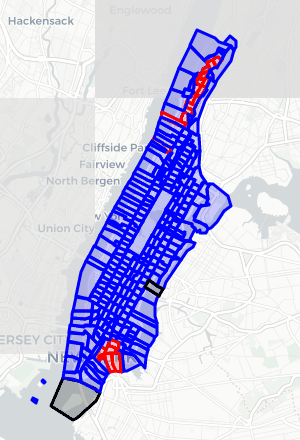

In [37]:
model.create_gif('GifMap_0.30')

In [38]:
model_vars_30 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


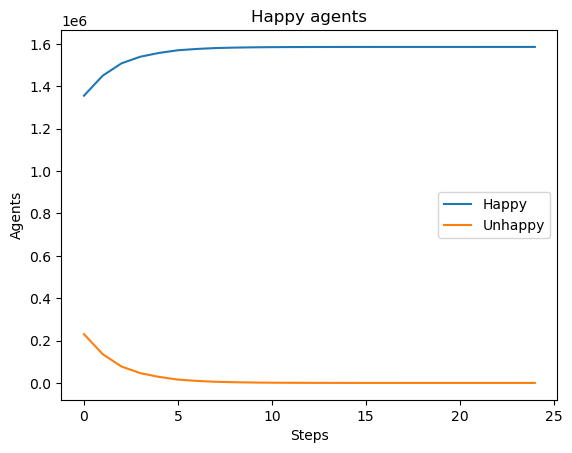

In [39]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_30.happy.plot(label = 'Happy')
model_vars_30.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [40]:
model_vars_30

,unhappy,happy
0,230244,1355629
1,135557,1450316
2,77405,1508468
3,46209,1539664
4,28290,1557583
5,15760,1570113
6,9582,1576291
7,5354,1580519
8,3289,1582584
9,1860,1584013


### Changing the similarity threshold

To speed up execution, the gif will not be created in following models, providing only a static visualization.

##### Similarity 20%

In [41]:
model = GeoSchellingModel(similarity_threshold = 0.20)

In [42]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1501482, 84391)

In [43]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed regions: 279
Average percentage of Red Agents in mixed regions: 0.27


In [44]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [45]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [46]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%----------100%


In [47]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 10 steps


##### Results

In [48]:
model.happy, model.unhappy

(1585873, 0)

In [49]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 9
Exclusive Blue regions: 85
Mixed regions: 194
Average percentage of Red Agents in mixed regions: 0.39


In [50]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 48


In [51]:
model.create_map(save_map = False)

In [52]:
model_vars_20 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


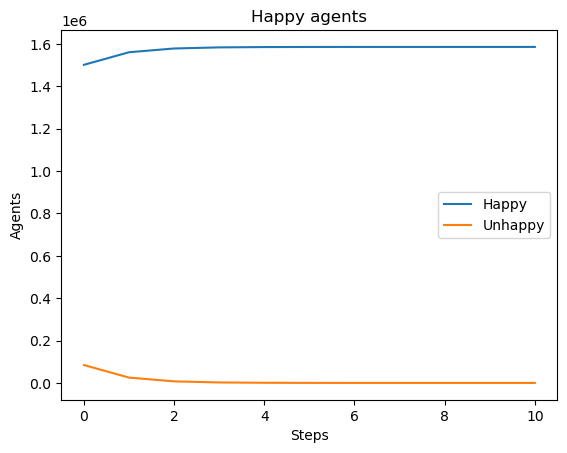

In [53]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_20.happy.plot(label = 'Happy')
model_vars_20.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [54]:
model_vars_20

,unhappy,happy
0,84391,1501482
1,25103,1560770
2,7360,1578513
3,2189,1583684
4,678,1585195
5,190,1585683
6,59,1585814
7,13,1585860
8,5,1585868
9,1,1585872


##### Similarity 40%

In [55]:
model = GeoSchellingModel(similarity_threshold = 0.40)

In [56]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1266860, 319013)

In [57]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed regions: 279
Average percentage of Red Agents in mixed regions: 0.27


In [58]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [59]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [60]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%--------------------------------------------------100%


In [61]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 50 steps


##### Results

In [62]:
model.happy, model.unhappy

(1585873, 0)

In [63]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 69
Exclusive Blue regions: 217
Mixed regions: 2
Average percentage of Red Agents in mixed regions: 0.57


In [64]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 71


In [65]:
model.create_map(save_map = False)

In [66]:
model_vars_40 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


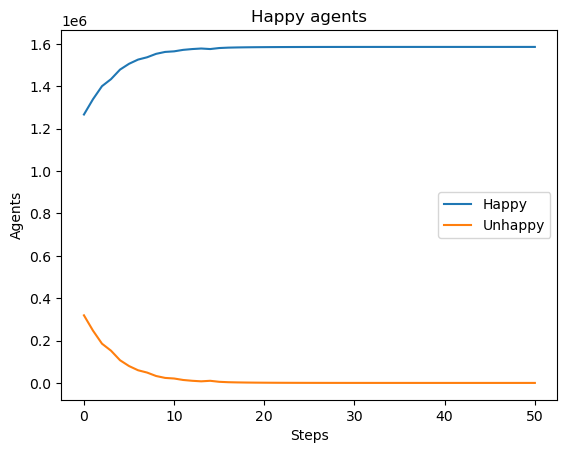

In [67]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_40.happy.plot(label = 'Happy')
model_vars_40.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [68]:
model_vars_40

,unhappy,happy
0,319013,1266860
1,246948,1338925
2,185206,1400667
3,152145,1433728
4,107071,1478802
5,79616,1506257
6,59784,1526089
7,48890,1536983
8,32664,1553209
9,23628,1562245


##### Similarity 50%

In [69]:
model = GeoSchellingModel(similarity_threshold = 0.50)

In [70]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1163615, 422258)

In [71]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed regions: 279
Average percentage of Red Agents in mixed regions: 0.27


In [72]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [73]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [74]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%-----------------------------------------------------------------------------100%


In [75]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 77 steps


##### Results

In [76]:
model.happy, model.unhappy

(1585873, 0)

In [77]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 44
Exclusive Blue regions: 244
Mixed regions: 0


In [78]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 44


In [79]:
model.create_map(save_map = False)

In [80]:
model_vars_50 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


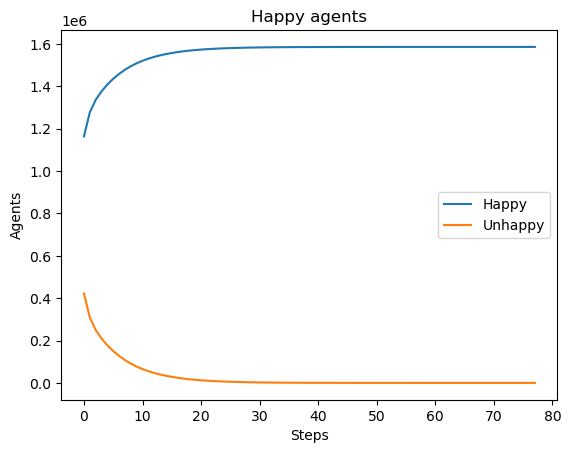

In [81]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_50.happy.plot(label = 'Happy')
model_vars_50.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [82]:
model_vars_50

,unhappy,happy
0,422258,1163615
1,308754,1277119
2,249979,1335894
3,209899,1375974
4,177375,1408498
5,150201,1435672
6,127333,1458540
7,107729,1478144
8,91141,1494732
9,77181,1508692


##### Similarity 60%

In [83]:
model = GeoSchellingModel(similarity_threshold = 0.60)

In [84]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(1034962, 550911)

In [85]:
regions = model.space.agents[:288] 

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regiosn: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed regiosn: 279
Average percentage of Red Agents in mixed regions: 0.27


In [86]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [87]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [88]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%------------------------------------------------100%


In [89]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 48 steps


##### Results

In [90]:
model.happy, model.unhappy

(1585873, 0)

In [91]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 72
Exclusive Blue regions: 216
Mixed regions: 0


In [92]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 72


In [93]:
model.create_map(save_map = False)

In [94]:
model_vars_60 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


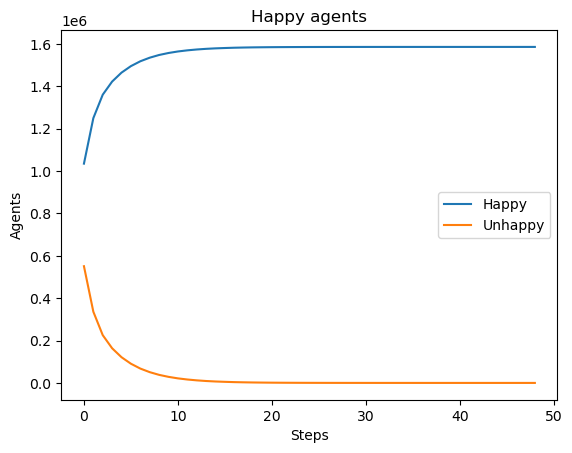

In [95]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_60.happy.plot(label = 'Happy')
model_vars_60.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [96]:
model_vars_60

,unhappy,happy
0,550911,1034962
1,336083,1249790
2,225483,1360390
3,163486,1422387
4,121244,1464629
5,90618,1495255
6,67751,1518122
7,50864,1535009
8,38046,1547827
9,28661,1557212


##### Similarity 75%

In [97]:
model = GeoSchellingModel(similarity_threshold = 0.75)

In [98]:
#n° of happy and unhappy agents
model.happy, model.unhappy

(692348, 893525)

In [99]:
regions = model.space.agents[:288]

red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 2
Exclusive Blue regions: 7
Mixed regions: 279
Average percentage of Red Agents in mixed regions: 0.27


In [100]:
init_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        init_red.append(i)
        
print('N. of red RegionAgents before the execution: {}'.format(len(init_red)))

N. of red RegionAgents before the execution: 21


In [101]:
model.create_map(save_map = False) #visualize the initial situation

##### Start the execution

In [102]:
print('0%', end = '')

while model.running and model.schedule.steps < 100:
    model.step()
    print('-', end = '')
    
print('100%')

0%------------------------100%


In [103]:
print('The model has done {} steps'.format(model.schedule.steps))

The model has done 24 steps


##### Results

In [104]:
model.happy, model.unhappy

(1585873, 0)

In [105]:
red = 0
blue = 0
mixed = []
for reg in regions:
    if reg.blue_cnt == 0:
        red += 1 
    elif reg.red_cnt == 0:
        blue += 1
    else:
        mixed.append(reg.red_cnt/(reg.red_cnt+reg.blue_cnt))
        
print('Exclusive Red regions: {}'.format(red))
print('Exclusive Blue regions: {}'.format(blue))
print('Mixed regions: {}'.format(len(mixed)))
if len(mixed) == 0:
    pass
else:
    print('Average percentage of Red Agents in mixed regions: {}'.format(round((sum(mixed)/len(mixed)), 2)))

Exclusive Red regions: 144
Exclusive Blue regions: 144
Mixed regions: 0


In [106]:
regions = model.space.agents[:288]
post_red = []
for i, reg in enumerate(regions):
    if reg.blue_cnt < reg.red_cnt:
        post_red.append(i)
        
print('N. of red RegionAgents after the execution: {}'.format(len(post_red)))

N. of red RegionAgents after the execution: 144


In [107]:
model.create_map(save_map = False)

In [108]:
model_vars_75 = model.datacollector.get_model_vars_dataframe()

Total agents: 1585873


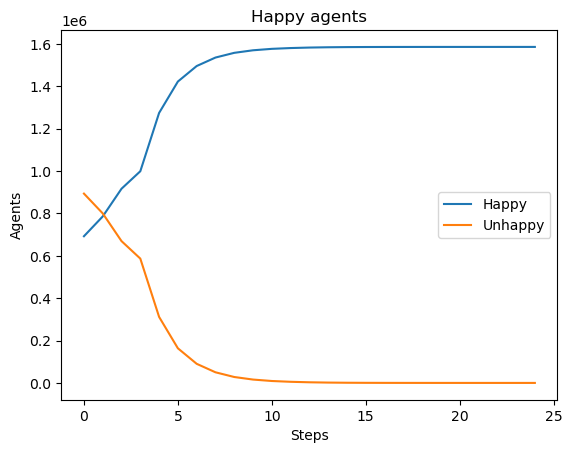

In [109]:
print("Total agents:", model.schedule.get_agent_count())

model_vars_75.happy.plot(label = 'Happy')
model_vars_75.unhappy.plot(label = 'Unhappy')

plt.title("Happy agents")
plt.xlabel("Steps")
plt.ylabel("Agents")
plt.legend()
plt.show()

In [110]:
model_vars_75

,unhappy,happy
0,893525,692348
1,800088,785785
2,669284,916589
3,586787,999086
4,311581,1274292
5,163383,1422490
6,90205,1495668
7,50174,1535699
8,27927,1557946
9,15861,1570012


### Analysis of the results

##### Model Initialization

<p style='text-align: justify;'>The first thing we observe about the initialization of the models is that the initial distribution of people in the tracts is always the same since it is not random but it starts from a real situation.</p>

<p style='text-align: justify;'>Initially, only 21 of the 288 census tracts have a majority of red (foreigners) PersonAgents inside of them, 2 have the same number of reds and blues (Americans), and all of the other tracts have a blue majority. Analyzing in detail the type of PersonAgents in each tract, it can be noticed that only 9 tracts are entirely segregated, 7 exclusively blue and 2 exclusively red. All the remaining tracts are mixed and they have on average 27% of red agents.</p>

##### Model Execution

<p style='text-align: justify;'>Observing the execution of the models, with the exclusion of the one with 50% similarity, the number of unhappy agents in the various steps decreases significantly within the 10th step and it becomes zero within the 30th step. Models with a level of similarity close to 50% require a bigger number of steps to complete the execution. The extra number of steps is caused by the difficulty in allocating a relatively small number of unhappy agents since most of them become happy by the 10th step.</p>  
<p style='text-align: justify;'>Finally, focusing on the model with 50% similarity, it can be noted that around 85 steps are necessary to complete the execution and that the decrease of unhappy agents slows down around the 20th step.</p>

##### In-depth analysis of the model with similarity threshold = 0.50

<p style='text-align: justify;'>The model with a similarity of 50% takes many more steps than the other ones due to the unbalanced starting situation. Only less than 30% of the total PersonAgents are red. As can be seen from the initial situation, the majority of the tracts are blue, so there are at least 50% of blue agents inside of them. This means that almost all the blue agents are happy right from the start, as they are in tracts that already have a blue majority, while the red agents are mostly unhappy. The unhappy blue agents in a red tract will have a high probability of ending up in a blue one and therefore being happy when moving randomly into another tract. On the other hand, the red agents will have a high probability of moving from one blue tract to another blue one, remaining unhappy and having to change the tract again at the next step. This means that the high number of steps is given by the difficulty of allocating the unhappy red agents. Therefore, they can become happy only by falling into one of the few red tracts or by moving en masse in a blue tract and converting it in red.</p>

<p style='text-align: justify;'>This problem does not occur with higher or lower similarity. In the case of higher percentages, the more the percentage rises, the more the tracts where initially each type of agent is unhappy increase. On the contrary, the lower the percentage, the greater the number of tracts where each type of agent is happy.</p>

##### Final results

<p style='text-align: justify;'>After the execution of the model, all the PersonAgents are happy and the tracts are much more segregated than they are in the starting situation, with a majority of tracts with only one type of agent in them. This phenomenon is not observed in the presence of a particularly high tolerance, like with a similarity of 20%, where the quantity of segregated tracts is less than half of the total, with a prevalence of mixed ones.</p>

<p style='text-align: justify;'>If the similarity is increased to 30% the number of mixed tracts is less than half. They decrease even more with a similarity level of 40%. Finally, it can be observed that the mixed tracts become zero with a similarity of 50%.</p>

<p style='text-align: justify;'>In conclusion, it can be deduced that even starting from an initial situation with almost zero segregation, when the similarity levels are 30% or more we obtain a final situation where the segregated tracts are the majority or the totality.</p>